In [1]:
!nvidia-smi -L  

GPU 0: Tesla T4 (UUID: GPU-220771f4-bf1d-8caf-0392-7dfc8b6e4501)


In [1]:
RESET_PROJECT_FILES = True

if RESET_PROJECT_FILES:
  ! rm -rf DeepColor utils bash &&\
  git clone https://github.com/ArnoBen/DeepColor &&\
  mv DeepColor/* . &&\
  rm -rf DeepColor

Cloning into 'DeepColor'...
remote: Enumerating objects: 227, done.
remote: Counting objects: 100% (90/90), done.
remote: Compressing objects: 100% (61/61), done.
remote: Total 227 (delta 50), reused 67 (delta 29), pack-reused 137
Receiving objects: 100% (227/227), 164.55 MiB | 18.79 MiB/s, done.
Resolving deltas: 100% (106/106), done.
Checking out files: 100% (23/23), done.


In [2]:
import os


RESET_IMAGE_FOLDER = False

if RESET_IMAGE_FOLDER:
  ! rm -r images/

if not os.path.isdir('images'):
  # ! ./bash/download_extract_ffhq.sh
  ! gdown 1RPwXAU6q72N2UMw4i7UfhELNlV_VAw58
  ! 7z x 'coco_256.7z'

Downloading...
From: https://drive.google.com/uc?id=1RPwXAU6q72N2UMw4i7UfhELNlV_VAw58
To: /content/coco_256.7z
100% 571M/571M [00:08<00:00, 67.6MB/s]

7-Zip [64] 16.02 : Copyright (c) 1999-2016 Igor Pavlov : 2016-05-21
p7zip Version 16.02 (locale=en_US.UTF-8,Utf16=on,HugeFiles=on,64 bits,2 CPUs Intel(R) Xeon(R) CPU @ 2.20GHz (406F0),ASM,AES-NI)

Scanning the drive for archives:
  0M Scan         1 file, 570834494 bytes (545 MiB)

Extracting archive: coco_256.7z
--
Path = coco_256.7z
Type = 7z
Physical Size = 570834494
Headers Size = 111439
Method = Copy
Solid = -
Blocks = 13000

  0%      6% 848 - images/test/40000/000000487733.jpg                                              12% 1635 - images/train/01000/000000361301.jpg                                                16% 2155

In [3]:
import os
import time
import datetime
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
import matplotlib
import cv2
from PIL import Image
from utils.dataset import make_dataset
from utils.conversions import rgb2lab, lab2rgb, bgr2rgb, bgr2lab, denormalize_lab
from utils.decomposition import decompose, recompose, decompose_generator
from keras.callbacks import TensorBoard, LearningRateScheduler, EarlyStopping
from keras.preprocessing.image import ImageDataGenerator 
from tensorflow.keras.layers import Layer, Conv2D, LeakyReLU, BatchNormalization, ReLU, Conv2DTranspose, Dropout, Concatenate
matplotlib.rcParams["axes.spines.left"] = False
matplotlib.rcParams["axes.spines.bottom"] = False
matplotlib.rcParams["xtick.major.bottom"] = False
matplotlib.rcParams["ytick.major.left"] = False

# Pix2pix GAN implementation for image colorization

Using a more straightforward implementation

https://machinelearningmastery.com/how-to-implement-pix2pix-gan-models-from-scratch-with-keras/

## Discriminator

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 input_2 (InputLayer)           [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 concatenate (Concatenate)      (None, 256, 256, 6)  0           ['input_1[0][0]',                
                                                                  'input_2[0][0]']            

/usr/local/lib/python3.7/dist-packages/keras/optimizers/optimizer_v2/adam.py:110: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


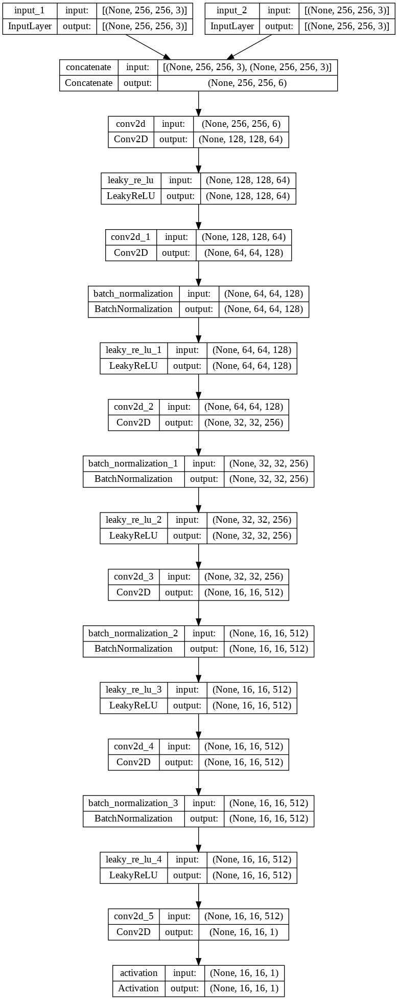

In [4]:
# example of defining a 70x70 patchgan discriminator model
from keras.optimizers import Adam
from keras.initializers import RandomNormal
from keras.models import Model
from keras.layers import Input
from keras.layers import Conv2D
from keras.layers import LeakyReLU
from keras.layers import Activation
from keras.layers import Concatenate
from keras.layers import BatchNormalization
from keras.layers import Lambda
from keras.layers import Reshape
from keras.utils.vis_utils import plot_model

# define the discriminator model
def define_discriminator(image_shape):
	# weight initialization
	init = RandomNormal(stddev=0.02)
	# source image input
	in_src_image = Input(shape=image_shape)
	# target image input
	in_target_image = Input(shape=image_shape)
	# concatenate images channel-wise
	merged = Concatenate()([in_src_image, in_target_image])
	# C64
	d = Conv2D(64, (4,4), strides=(2,2), padding='same', kernel_initializer=init)(merged)
	d = LeakyReLU(alpha=0.2)(d)
	# C128
	d = Conv2D(128, (4,4), strides=(2,2), padding='same', kernel_initializer=init)(d)
	d = BatchNormalization()(d)
	d = LeakyReLU(alpha=0.2)(d)
	# C256
	d = Conv2D(256, (4,4), strides=(2,2), padding='same', kernel_initializer=init)(d)
	d = BatchNormalization()(d)
	d = LeakyReLU(alpha=0.2)(d)
	# C512
	d = Conv2D(512, (4,4), strides=(2,2), padding='same', kernel_initializer=init)(d)
	d = BatchNormalization()(d)
	d = LeakyReLU(alpha=0.2)(d)
	# second last output layer
	d = Conv2D(512, (4,4), padding='same', kernel_initializer=init)(d)
	d = BatchNormalization()(d)
	d = LeakyReLU(alpha=0.2)(d)
	# patch output
	d = Conv2D(1, (4,4), padding='same', kernel_initializer=init)(d)
	patch_out = Activation('sigmoid')(d)
	# define model
	model = Model([in_src_image, in_target_image], patch_out)
	# compile model
	opt = Adam(lr=0.0002, beta_1=0.5)
	model.compile(loss='binary_crossentropy', optimizer=opt, loss_weights=[0.5])
	return model

# define image shape
image_shape = (256,256,3)
# create the model
model = define_discriminator(image_shape)
# summarize the model
model.summary()
# plot the model
plot_model(model, to_file='discriminator_model_plot.png', show_shapes=True, show_layer_names=True)

## Generator

In [5]:
# example of defining a u-net encoder-decoder generator model

# define an encoder block
def define_encoder_block(layer_in, n_filters, batchnorm=True):
	# weight initialization
	init = RandomNormal(stddev=0.02)
	# add downsampling layer
	g = Conv2D(n_filters, (4,4), strides=(2,2), padding='same', kernel_initializer=init)(layer_in)
	# conditionally add batch normalization
	if batchnorm:
		g = BatchNormalization()(g, training=True)
	# leaky relu activation
	g = LeakyReLU(alpha=0.2)(g)
	return g

# define a decoder block
def decoder_block(layer_in, skip_in, n_filters, dropout=True):
	# weight initialization
	init = RandomNormal(stddev=0.02)
	# add upsampling layer
	g = Conv2DTranspose(n_filters, (4,4), strides=(2,2), padding='same', kernel_initializer=init)(layer_in)
	# add batch normalization
	g = BatchNormalization()(g, training=True)
	# conditionally add dropout
	if dropout:
		g = Dropout(0.5)(g, training=True)
	# merge with skip connection
	g = Concatenate()([g, skip_in])
	# relu activation
	g = Activation('relu')(g)
	return g

# define the standalone generator model
def define_generator(image_shape=(256,256,1)):
    """
    Input image is NORMALIZED L
    Output image is NORMALIZED Lab
    """
    # weight initialization
    init = RandomNormal(stddev=0.02)
    # image input
    in_grayscale = Input(shape=image_shape)
    # in_image = in_image / 255
    # Splitting L and ab channel
    # L_channel = Lambda(lambda x: x[..., 0][..., tf.newaxis], input_shape=image_shape)(in_image)
    # ab_channels = Lambda(lambda x: x[..., 1:], input_shape=image_shape)(in_image)
    # # Normalizing inputs
    # L_channel = L_channel / 50 - 1
    # ab_channels /= 127
    
    # encoder model: C64-C128-C256-C512-C512-C512-C512-C512
    e1 = define_encoder_block(in_grayscale, 64, batchnorm=False)
    e2 = define_encoder_block(e1, 128)
    e3 = define_encoder_block(e2, 256)
    e4 = define_encoder_block(e3, 512)
    e5 = define_encoder_block(e4, 512)
    e6 = define_encoder_block(e5, 512)
    e7 = define_encoder_block(e6, 512)
    # bottleneck, no batch norm and relu
    b = Conv2D(512, (4,4), strides=(2,2), padding='same', kernel_initializer=init)(e7)
    b = Activation('relu')(b)
    # decoder model: CD512-CD1024-CD1024-C1024-C1024-C512-C256-C128
    d1 = decoder_block(b, e7, 512)
    d2 = decoder_block(d1, e6, 512)
    d3 = decoder_block(d2, e5, 512)
    d4 = decoder_block(d3, e4, 512, dropout=False)
    d5 = decoder_block(d4, e3, 256, dropout=False)
    d6 = decoder_block(d5, e2, 128, dropout=False)
    d7 = decoder_block(d6, e1, 64, dropout=False)
    # output
    g = Conv2DTranspose(2, (4,4), strides=(2,2), padding='same', kernel_initializer=init)(d7)
    out_ab = Activation('sigmoid')(g)
    # Denormalizing
    # L_channel = (L_channel + 1) * 50
    # out_ab *= 127
    # Now, L : 0, 100 and ab: -127, 127

    # out_Lab = Concatenate()([in_grayscale, out_ab])
    # out_Lab_denormalized = out_Lab * 255
    # define model
    model = Model(in_grayscale, out_ab)
    return model

# define image shape
image_shape = (256,256,1)
# create the model
model = define_generator(image_shape)
# summarize the model
model.summary()
# plot the model
# plot_model(model, to_file='generator_model_plot.png', show_shapes=True, show_layer_names=True)

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_3 (InputLayer)           [(None, 256, 256, 1  0           []                               
                                )]                                                                
                                                                                                  
 conv2d_6 (Conv2D)              (None, 128, 128, 64  1088        ['input_3[0][0]']                
                                )                                                                 
                                                                                                  
 leaky_re_lu_5 (LeakyReLU)      (None, 128, 128, 64  0           ['conv2d_6[0][0]']               
                                )                                                           

In [6]:
def define_gan(g_model, d_model, image_shape):
	# make weights in the discriminator not trainable
	for layer in d_model.layers:
		if not isinstance(layer, BatchNormalization):
			layer.trainable = False
	# define the source image
	in_src = Input(shape=image_shape)
	grayscale_input = Lambda(lambda x: x[..., 0][..., tf.newaxis], input_shape=image_shape)(in_src)
	# connect the source image to the generator input
	gen_out = g_model(grayscale_input)
	# connect the source input and generator output to the discriminator input
	dis_out = d_model([in_src, gen_out])
	# src image as input, generated image and classification output
	model = Model(in_src, [dis_out, gen_out])
	# compile model
	opt = Adam(lr=0.0002, beta_1=0.5)
	model.compile(loss=['binary_crossentropy', 'mae'], optimizer=opt, loss_weights=[1,100])
	return model

# define image shape
image_shape = (256,256,3)
#define the models
g_model = define_generator((image_shape[0], image_shape[0], 1))
d_model = define_discriminator(image_shape)
# define the composite model
gan_model = define_gan(g_model, d_model, image_shape)
# summarize the model
gan_model.summary()
# plot the model
plot_model(gan_model, to_file='gan_model_plot.png', show_shapes=True, show_layer_names=True)

ValueError: ignored

In [ ]:
# train pix2pix models
def train(d_model, g_model, gan_model, dataset, n_epochs=100, n_batch=1, n_patch=16):
	# unpack dataset
	trainA, trainB = dataset
	# calculate the number of batches per training epoch
	bat_per_epo = int(len(trainA) / n_batch)
	# calculate the number of training iterations
	n_steps = bat_per_epo * n_epochs
	# manually enumerate epochs
	for i in range(n_steps):
		# select a batch of real samples
		[X_realA, X_realB], y_real = generate_real_samples(dataset, n_batch, n_patch)
		# generate a batch of fake samples
		X_fakeB, y_fake = generate_fake_samples(g_model, X_realA, n_patch)
		# update discriminator for real samples
		d_loss1 = d_model.train_on_batch([X_realA, X_realB], y_real)
		# update discriminator for generated samples
		d_loss2 = d_model.train_on_batch([X_realA, X_fakeB], y_fake)
		# update the generator
		g_loss, _, _ = gan_model.train_on_batch(X_realA, [y_real, X_realB])
		# summarize performance
		print('>%d, d1[%.3f] d2[%.3f] g[%.3f]' % (i+1, d_loss1, d_loss2, g_loss))

In [ ]:
tf.config.run_functions_eagerly(True)

In [ ]:
# def generate_images(model, test_input, target):
#   prediction = model(test_input)
#   fig, axes = plt.subplots(1, 3, figsize=(9, 3))
#   titles = ['Input Image', 'Ground Truth', 'Predicted Image']

#   axes[0].imshow(test_input[0, :, :, 0], cmap='gray')
#   axes[1].imshow(target[0])
#   axes[2].imshow(lab2rgb(prediction_lab))

#   for i, title in enumerate(titles):
#     axes[i].set_title(title)
#   plt.tight_layout()
#   plt.show()


# class GenerateImageCallback(tf.keras.callbacks.Callback):
#     def __init__(self, target):
#         super(GenerateImageCallback, self).__init__()
        
#         self.target = lab2rgb(target)[tf.newaxis, ...]
#         L, ab = decompose(target)
#         self.input = tf.cast(L, tf.float32)[tf.newaxis, ...]


#     def on_epoch_end(self, epoch, logs=None):
#         generate_images(self.model, self.input, self.target)


# img = bgr2lab(cv2.imread('sloth-256.jpg'))
# generate_image_callback = GenerateImageCallback(img)
# generate_images(g_model, generate_image_callback.input, generate_image_callback.target)

In [7]:
# Logs
log_dir = os.path.join("logs", datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))

# Tensorboard
tensorboard_callback = TensorBoard(log_dir=log_dir, histogram_freq=1)

# Early stopping
early_stopping = EarlyStopping(patience=5, restore_best_weights=True)

# Learning rate scheduler
def scheduler(epoch, lr):
    # Decreases the lr exponentially every n epoch
    return lr * tf.math.exp(-0.1) if ((epoch != 0) and (epoch % 4 == 0)) else lr
    
lr_scheduler = LearningRateScheduler(scheduler)

In [8]:
%load_ext tensorboard
%tensorboard --logdir logs

<IPython.core.display.Javascript object>

In [9]:
# generator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
# g_model = define_generator()
# g_model.compile(optimizer=generator_optimizer, loss="mae")
# img = bgr2lab(cv2.imread('sloth-256.jpg'))
# for i in range(20):
#   g_model.fit(img[np.newaxis, ...], img[np.newaxis, ...])

In [10]:
X = make_dataset(10000, 100, 100)

Getting all images paths and removing greyscale images


0it [00:00, ?it/s]
0it [00:00, ?it/s]
0it [00:00, ?it/s]


Greyscale images may have been removed, hence the possibly smaller final size

 {'train': 0, 'valid': 0, 'test': 0}
Loading data in dictionary and converting to Lab colorspace.


0it [00:00, ?it/s]
0it [00:00, ?it/s]
0it [00:00, ?it/s]


Done.


In [6]:
X_train = np.empty((X['train'].shape[0], 256, 256, 3), dtype=np.uint8)
for (k, image) in enumerate(X['train']):
    X_train[k] = cv2.resize(image, dsize=(256, 256))

X_valid = np.empty((X['valid'].shape[0], 256, 256, 3), dtype=np.uint8)
for (k, image) in enumerate(X['valid']):
    X_valid[k] = cv2.resize(image, dsize=(256, 256))

In [10]:
def preprocessing(image):
    image = np.array(image, dtype=np.uint8)
    lab_image = cv2.cvtColor(image, cv2.COLOR_RGB2LAB) / 255
    return lab_image

datagen = ImageDataGenerator(
    horizontal_flip=True,
    preprocessing_function = preprocessing
    )

train_data = datagen.flow_from_directory("images/train/", class_mode=None, target_size=(256, 256), batch_size=64)
valid_data = datagen.flow_from_directory("images/valid/", class_mode=None, target_size=(256, 256), batch_size=64)

Found 10000 images belonging to 10 classes.
Found 2000 images belonging to 2 classes.


In [11]:
def custom_generator(data_generator):
    i = 0
    n = data_generator.samples
    batch_size = data_generator.batch_size
    end_index = n - n % batch_size
    while True:
        batch = data_generator.next()
        L_batch = batch[..., 0][..., np.newaxis]
        ab_batch = batch[..., 1:]
        yield L_batch, ab_batch
        i += batch_size
        if i >= end_index:
            i = 0
            

def custom_generator_from_array(X, batch_size):
  """
  X: lab in 0 - 255
  output: L, ab, -1, 1
  """
  i = 0
  n = X.shape[0]
  end_index = n - n % batch_size
  while True:
      L = (X[i: i + batch_size][..., 0][..., np.newaxis] / 255).astype(np.float32)
      ab = (X[i: i + batch_size][..., 1:] / 255).astype(np.float32)
      # if flip_horizontal and np.random.randint(0, 2):  ## coinflip
      #     yield L[:, ::-1, :], ab[:, ::-1, :]
      # else:
      yield L, ab
      i += batch_size
      if i >= end_index:
          i = 0

In [12]:
input_shape = (256, 256, 1)
generator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
g_model = define_generator(input_shape)
g_model.compile(optimizer=generator_optimizer, loss="mae")

157/157 [==============================] - 168s 956ms/step - loss: 0.0380 - val_loss: 0.0375


In [16]:
g_model.fit(custom_generator(train_data), 
            validation_data=custom_generator(valid_data),
            steps_per_epoch=len(train_data),
            validation_steps=len(valid_data),
            callbacks=[tensorboard_callback],
            epochs=10
            )

Epoch 1/10
157/157 [==============================] - 157s 1s/step - loss: 0.0367 - val_loss: 0.0371
Epoch 2/10
157/157 [==============================] - 158s 1s/step - loss: 0.0362 - val_loss: 0.0364
Epoch 3/10
157/157 [==============================] - 158s 1s/step - loss: 0.0357 - val_loss: 0.0360
Epoch 4/10
157/157 [==============================] - 158s 1s/step - loss: 0.0355 - val_loss: 0.0362
Epoch 5/10
157/157 [==============================] - 158s 1s/step - loss: 0.0348 - val_loss: 0.0357
Epoch 6/10
  5/157 [..............................] - ETA: 2:03 - loss: 0.0359

KeyboardInterrupt: ignored

2/2 [==============================] - 0s 154ms/step


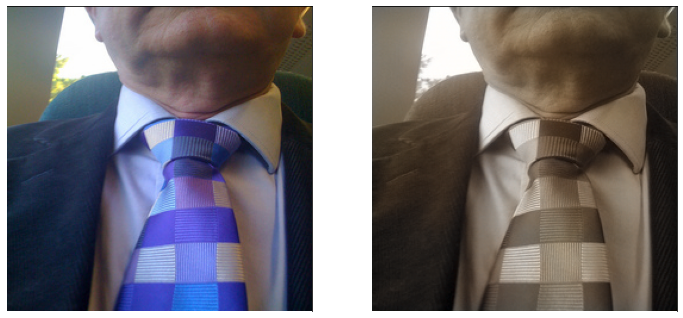

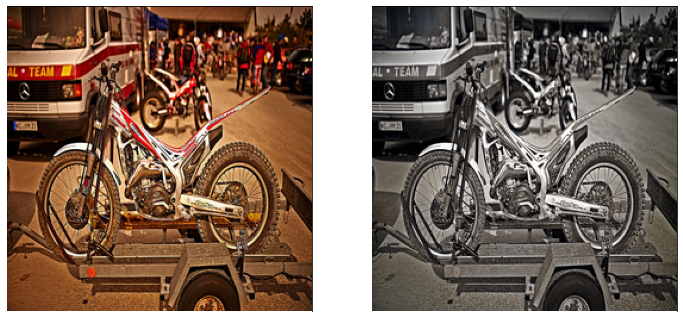

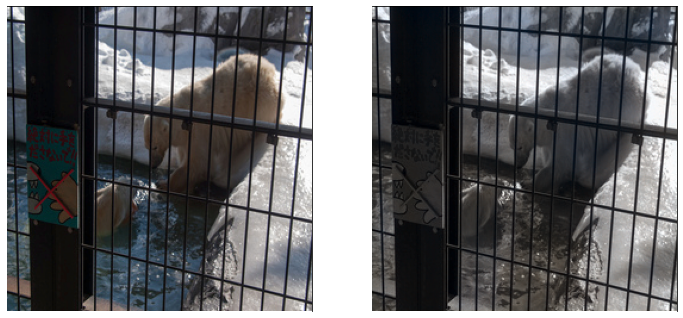

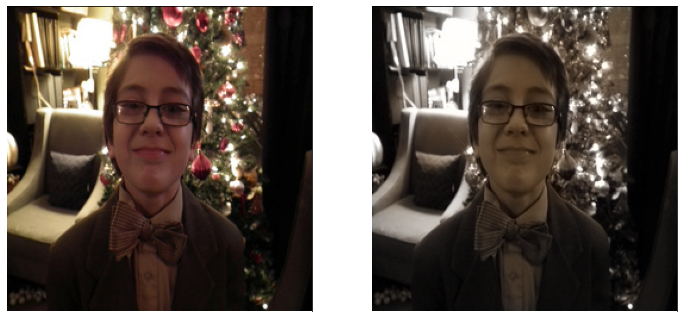

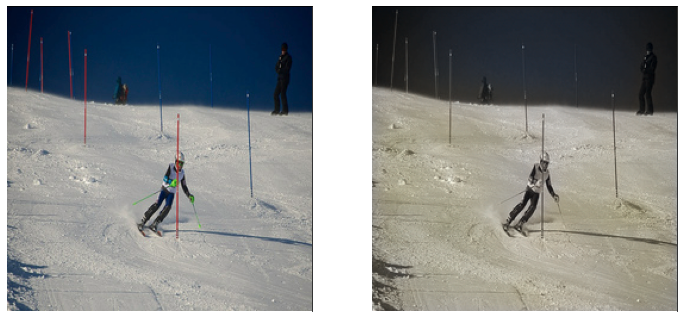

In [18]:
for i, Lab in enumerate(custom_generator(train_data)):
  L, ab = Lab
  fig, axes = plt.subplots(1, 2, figsize=(12, 6))
  ab_pred = g_model.predict(L)
  
  img = np.concatenate((L[0], ab[0]), axis=-1)
  img_pred = np.concatenate((L[0], ab_pred[0]), axis=-1)

  img = (img * 255).astype(np.uint8)
  img_pred = (img_pred * 255).astype(np.uint8)
  
  axes[0].imshow(cv2.cvtColor(img, cv2.COLOR_LAB2RGB))
  axes[1].imshow(cv2.cvtColor(img_pred, cv2.COLOR_LAB2RGB))
  if i == 4:
    break

In [36]:
# BASELINE MODEL

from keras.layers import Conv2D, UpSampling2D, InputLayer
from keras.models import Sequential

model = Sequential()
model.add(InputLayer(input_shape=(128, 128, 1)))
model.add(Conv2D(64, (3, 3), activation='relu', padding='same'))
model.add(Conv2D(64, (3, 3), activation='relu', padding='same', strides=2))
model.add(Conv2D(128, (3, 3), activation='relu', padding='same'))
model.add(Conv2D(128, (3, 3), activation='relu', padding='same', strides=2))
model.add(Conv2D(256, (3, 3), activation='relu', padding='same'))
model.add(Conv2D(256, (3, 3), activation='relu', padding='same', strides=2))
model.add(Conv2D(512, (3, 3), activation='relu', padding='same'))
model.add(Conv2D(256, (3, 3), activation='relu', padding='same'))
model.add(Conv2D(128, (3, 3), activation='relu', padding='same'))
model.add(UpSampling2D((2, 2)))
model.add(Conv2D(64, (3, 3), activation='relu', padding='same'))
model.add(UpSampling2D((2, 2)))
model.add(Conv2D(32, (3, 3), activation='relu', padding='same'))
model.add(Conv2D(2, (3, 3), activation='tanh', padding='same'))
model.add(UpSampling2D((2, 2)))

model.compile(optimizer='adam', loss="mae")

batch_size = 32
steps = X['train'].shape[0] // batch_size
valid_steps = X['valid'].shape[0] // batch_size
model.fit(custom_generator_from_array(X['train'], batch_size), 
          steps_per_epoch=steps,
          validation_data=custom_generator_from_array(X['valid'], batch_size),
          validation_steps=valid_steps,
          # callbacks=[tensorboard_callback]
          epochs=10
          )

Epoch 1/10
312/312 [==============================] - 33s 103ms/step - loss: 0.0546 - val_loss: 0.0331
Epoch 2/10
312/312 [==============================] - 33s 107ms/step - loss: 0.0338 - val_loss: 0.0312
Epoch 3/10
312/312 [==============================] - 33s 105ms/step - loss: 0.0328 - val_loss: 0.0305
Epoch 4/10
312/312 [==============================] - 33s 105ms/step - loss: 0.0327 - val_loss: 0.0308
Epoch 5/10
312/312 [==============================] - 33s 105ms/step - loss: 0.0321 - val_loss: 0.0297
Epoch 6/10
312/312 [==============================] - 33s 105ms/step - loss: 0.0317 - val_loss: 0.0296
Epoch 7/10
138/312 [============>.................] - ETA: 18s - loss: 0.0312

KeyboardInterrupt: ignored

1/1 [==============================] - 0s 16ms/step


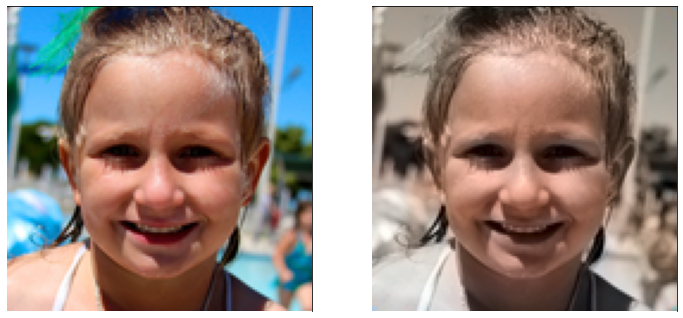

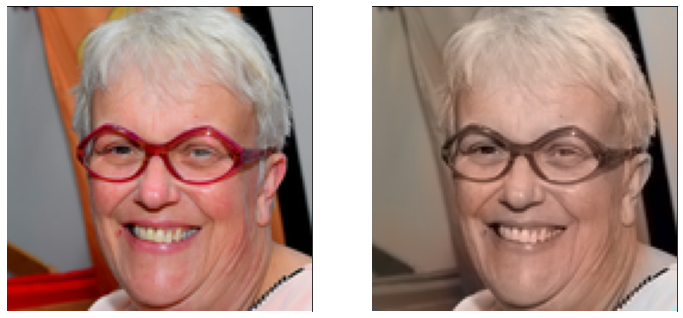

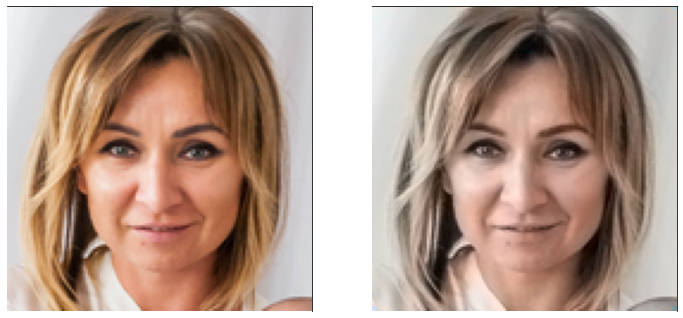

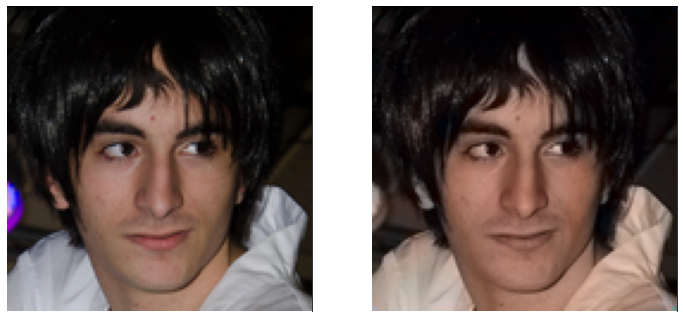

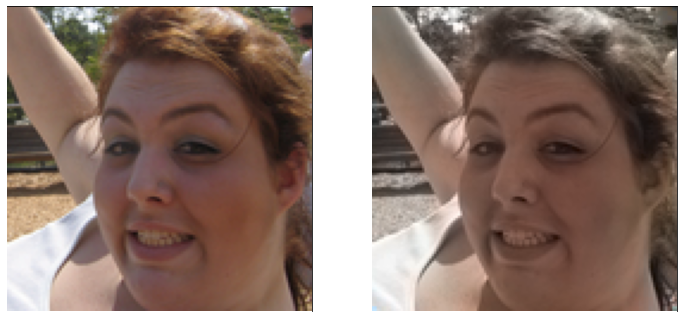

In [39]:
for i, Lab in enumerate(custom_generator_from_array(X['valid'], 1)):
  L, ab = Lab
  fig, axes = plt.subplots(1, 2, figsize=(12, 6))
  ab_pred = model.predict(L)
  
  img = np.concatenate((L[0], ab[0]), axis=-1)
  img_pred = np.concatenate((L[0], ab_pred[0]), axis=-1)

  img = (img * 255).astype(np.uint8)
  img_pred = (img_pred * 255).astype(np.uint8)
  
  axes[0].imshow(cv2.cvtColor(img, cv2.COLOR_LAB2RGB))
  axes[1].imshow(cv2.cvtColor(img_pred, cv2.COLOR_LAB2RGB))
  if i == 4:
    break

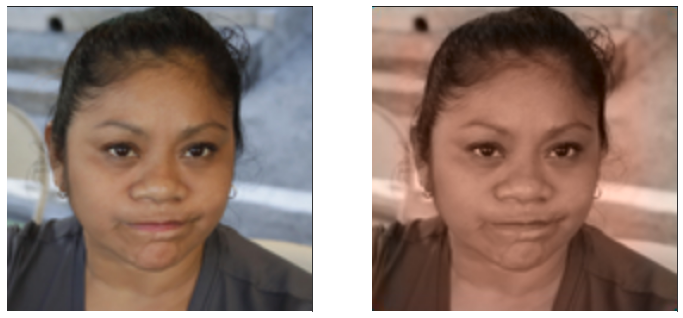

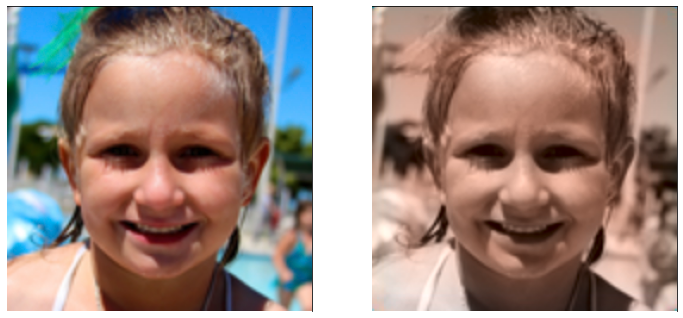

In [ ]:
train_img = X_train[2] / 255
test_img = X_valid[0] / 255

def compare(model, img):
  fig, axes = plt.subplots(1, 2, figsize=(12, 6))
  prediction = model(img[np.newaxis, ...][..., 0]).numpy()[0]
  prediction_lab = np.concatenate((img[..., 0][..., np.newaxis], prediction), axis=-1) * 255
  prediction_lab = prediction_lab.astype(np.uint8)
  img = (img * 255).astype(np.uint8)
  axes[0].imshow(cv2.cvtColor(img, cv2.COLOR_LAB2RGB))
  axes[1].imshow(cv2.cvtColor(prediction_lab, cv2.COLOR_LAB2RGB))

compare(model, train_img)
compare(model, test_img)

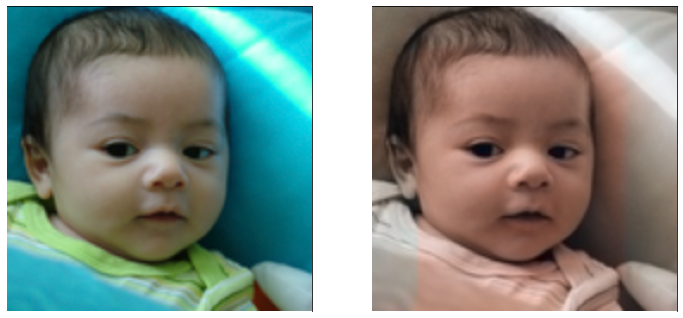

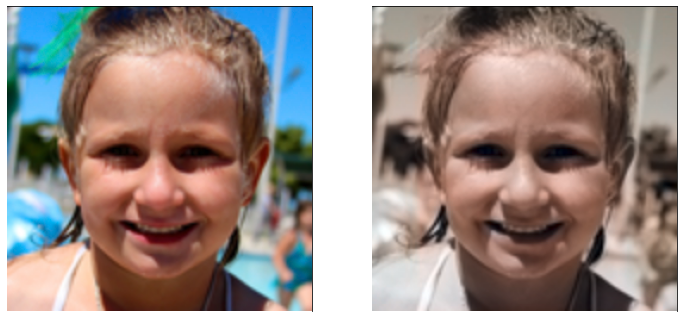

In [ ]:
train_img = X_train[0] / 255
test_img = X_valid[0] / 255

def compare(model, img):
  fig, axes = plt.subplots(1, 2, figsize=(12, 6))
  prediction = model(img[np.newaxis, ...][..., 0]).numpy()[0]
  prediction_lab = np.concatenate((img[..., 0][..., np.newaxis], prediction), axis=-1) * 255
  prediction_lab = prediction_lab.astype(np.uint8)
  img = (img * 255).astype(np.uint8)
  axes[0].imshow(cv2.cvtColor(img, cv2.COLOR_LAB2RGB))
  axes[1].imshow(cv2.cvtColor(prediction_lab, cv2.COLOR_LAB2RGB))

compare(model, train_img)
compare(model, test_img)

In [ ]:
for i in range(5):
  g_model.fit(custom_generator(train_data),
              validation_data=custom_generator(valid_data),
              validation_steps=len(valid_data),
              steps_per_epoch=len(train_data))

157/157 [==============================] - 159s 1s/step - loss: 5.7325 - val_loss: 6.1118


In [ ]:
g_model.save_weights("weights/gan_generator_6.112")

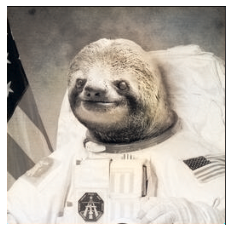

In [ ]:
img = cv2.cvtColor(cv2.imread('sloth-256.jpg'), cv2.COLOR_BGR2LAB)
prediction = g_model(img[tf.newaxis, ...]).numpy()[0].astype(np.uint8)
plt.imshow(cv2.cvtColor(prediction, cv2.COLOR_LAB2RGB))

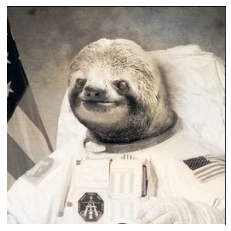

In [ ]:
img = cv2.cvtColor(cv2.imread('sloth-256.jpg'), cv2.COLOR_BGR2LAB)
prediction = g_model(img[tf.newaxis, ...]).numpy()[0].astype(np.uint8)
plt.imshow(cv2.cvtColor(prediction, cv2.COLOR_LAB2RGB))

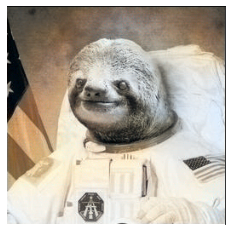

In [ ]:
img = bgr2lab(cv2.imread('sloth-256.jpg'))
plt.imshow(lab2rgb(g_model(img[tf.newaxis, ...]).numpy()[0]))